# Single Variable Linear Regression With Batch Gradient Descent [45 Marks]

- For this practical work, students will develop a Python program that is able to implement the gradient descent in order to achieve the linear regression (Single Variable) of a set of datapoints.
- We will know how to implement MSE loss function as vector norm.
- We will also plot the learning curves, define stop conditions, and see the learning rate effect.
- We will also evaluate the linear regeression model performance.

### Import numpy, matplotlib.pyplot

In [224]:
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline

### Read RegData csv file into numpy array 

In [225]:
data = np.genfromtxt('RegData.csv',delimiter=',')

In [226]:
data

array([[2.9000001 , 4.        ],
       [6.69999981, 7.4000001 ],
       [4.9000001 , 5.        ],
       [7.9000001 , 7.19999981],
       [9.80000019, 7.9000001 ],
       [6.9000001 , 6.0999999 ],
       [6.0999999 , 6.        ],
       [6.19999981, 5.80000019],
       [6.        , 5.19999981],
       [5.0999999 , 4.19999981],
       [4.69999981, 4.        ],
       [4.4000001 , 4.4000001 ],
       [5.80000019, 5.19999981]])

### Define variables X and y. [2 Marks]
### Assign first column data to X and second column to y
<b>Note:</b> X is the independent variable (input to LR model) and y is the dependent variable (output)

In [227]:
X = data[:,0]
y = data[:,1]

In [228]:
print('X = ')
X

X = 


array([2.9000001 , 6.69999981, 4.9000001 , 7.9000001 , 9.80000019,
       6.9000001 , 6.0999999 , 6.19999981, 6.        , 5.0999999 ,
       4.69999981, 4.4000001 , 5.80000019])

In [229]:
print('y = ')
y

y = 


array([4.        , 7.4000001 , 5.        , 7.19999981, 7.9000001 ,
       6.0999999 , 6.        , 5.80000019, 5.19999981, 4.19999981,
       4.        , 4.4000001 , 5.19999981])

### Plot the data (scatter plot of X,y) [2 Marks]

In [230]:
plt.scatter(X,y)
plt.xlabel('X')
plt.ylabel('y')
plt.figure(figsize=(6, 4))

<Figure size 600x400 with 0 Axes>

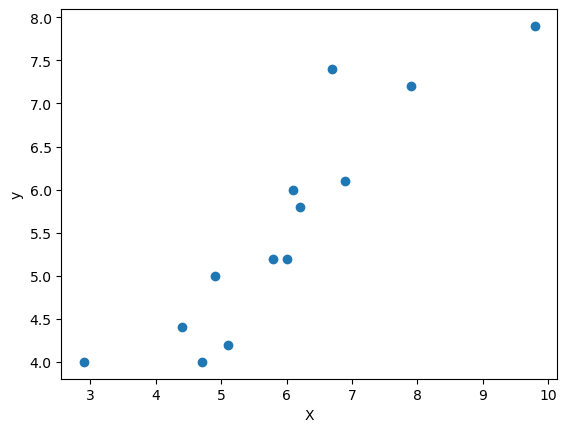

<Figure size 600x400 with 0 Axes>

In [231]:
plt.show()

## Single Variable LR Implementation

### Follow the following steps:

### Step1: Initialize model parameters (theta_0 & theta_1): [2 Marsk]
- It is recommended to intitialize theta_0 = 0 and theta_1 = 0.
- Define the Learning rate value e.g. 0.01.
- Get the number of data points (m).

In [232]:
theta_0 = 0
theta_1 = 0
eta = 0.01

In [233]:
m = len(y)
print("number of data points (m): ", m)

number of data points (m):  13


### Step2: Use (theta_0 & theta_1) to predict the output h(x)= theta_0 + theta_1 * x. [2 Marks]
- Do not loop through data points. Simply multiply X by theta_1 then add to theta_0.

In [234]:
y_pred = theta_0 + theta_1 * X

In [235]:
y_pred

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

### Step3: Calculate the MSE Cost function 𝑱(theta_0,theta_1 ). [2 Marks]
<b>Note:</b> You better use norm square of the error vector.

In [236]:
error = y_pred - y
J = (1/(2*m)) * np.sum(error**2)

In [237]:
print("Error Vector: ", error)

print("j = ", J)

Error Vector:  [-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981]
j =  16.305384479692318


### Step4: Calculate the gradient components for theta_0 and theta_1. [2 Marks]
<b>Note:</b> You can use the error vector calculated in the previous step.

In [238]:
gradient_0 = (1/m) * np.sum(error)
gradient_1 = (1/m) * np.sum(error * X)

In [239]:
print("d_theta_0 = ", gradient_0)
print("d_theta_1 = ", gradient_1)

d_theta_0 =  -5.569230739769231
d_theta_1 =  -35.043846043215375


### Step5: Update the parameters [2 Marks]

In [240]:
theta_0 = theta_0 - eta * gradient_0
theta_1 = theta_1 - eta * gradient_1

In [241]:
print("theta_0 = ", theta_0)
print("theta_1 = ", theta_1)

theta_0 =  0.05569230739769231
theta_1 =  0.35043846043215376


##### You made only one iteration. You need to iterate till converge to the optimum solution (acheive the minimum of the cost function) or reach to the maximum number of iterations.

### Step6: Repeat steps from 2 to 5 till maximum number of iterations achieved (e.g. 1000): [5 Marks]
### Do not waste your time trying to obtain the same format exactly as the provided output. Focus on the correct implementation and provide the output in any format you like.

##### The objective from this step is to combine all the previous steps and iterate untill you achieve the maximum number of iterations (1000 iterations).
##### Do not forget to put the initialization of theta_0, theta_1, and learnig rate in the same cell (use learning rate = 0.001). 
##### For this step, do not apply any stop conditions. Let the optimizer reaches the maximum number of iterations.

In [242]:
theta_0 = 0
theta_1 = 0
eta = 0.001
iterations = 1000

In [243]:
for i in range(iterations):
    y_pred = theta_0 + theta_1 * X
    error = y_pred - y
    J = (1/(2*m)) * np.sum(error**2)
    gradient_0 = (1/m) * np.sum(error)
    gradient_1 = (1/m) * np.sum(error * X)
    grad_vector = np.array([[gradient_0], [gradient_1]])
    grad_norm = np.linalg.norm(grad_vector)
    theta_0 -= eta * gradient_0
    theta_1 -= eta * gradient_1
    print(f"****************** Iteration {i} ********************\n")
    print("h(x):", y_pred.flatten(), "\n")
    print("Error Vector:\n", error.flatten(), "\n")
    print("j =", J, "\n")
    print("Gradient Vector:\n", grad_vector, "\n")
    print("Gradient Vector Norm:\n", grad_norm, "\n")
    print("theta_0 :", theta_0)
    print("theta_1 :", theta_1)

****************** Iteration 0 ********************

h(x): [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] 

Error Vector:
 [-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981] 

j = 16.305384479692318 

Gradient Vector:
 [[ -5.56923074]
 [-35.04384604]] 

Gradient Vector Norm:
 35.483622652335995 

theta_0 : 0.005569230739769231
theta_1 : 0.03504384604321537
****************** Iteration 1 ********************

h(x): [0.10719639 0.24036299 0.17728408 0.28241562 0.34899893 0.24737177
 0.21933669 0.22284107 0.21583231 0.18429284 0.1702753  0.15976216
 0.20882354] 

Error Vector:
 [-3.89280361 -7.1596371  -4.82271592 -6.91758419 -7.55100117 -5.85262813
 -5.78066331 -5.57715912 -4.9841675  -4.01570697 -3.8297247  -4.24023794
 -4.99117626] 

j = 15.070907994095794 

Gradient Vector:
 [[ -5.35501584]
 [-33.6733067 ]] 

Gradient Vector Norm:
 34.09644818591864 

theta_0 : 0.010924246580564925
the

### Implement the stop condition: [2 Marks]
#### The optimizer reaches the optimium solution:
- This can be known if the norm of the gradient vector approximately equals to zero (practically we compare the gradient norm to a small value e.g <b>grad_norm < 0.1</b>).
- The check should be done before parameters update.

In [244]:
theta_0 = 0
theta_1 = 0
eta = 0.001
max_iters = 1000
tol = 0.1

In [245]:
for i in range(max_iters):
    y_pred = theta_0 + theta_1 * X
    error = y_pred - y
    J = (1/(2*m)) * np.sum(error**2)
    gradient_0 = (1/m) * np.sum(error)
    gradient_1 = (1/m) * np.sum(error * X)
    grad_vector = np.array([[gradient_0], [gradient_1]])
    grad_norm = np.linalg.norm(grad_vector)
    if grad_norm < tol:
        print(f"Convergence reached at iteration {i}.")
        break
    theta_0 -= eta * gradient_0
    theta_1 -= eta * gradient_1
    print(f"****************** Iteration {i} ********************\n")
    print("h(x):", y_pred.flatten(), "\n")
    print("Error Vector:\n", error.flatten(), "\n")
    print("j =", J, "\n")
    print("Gradient Vector:\n", grad_vector, "\n")
    print("Gradient Vector Norm:\n", grad_norm, "\n")
    print("theta_0 :", theta_0)
    print("theta_1 :", theta_1)
    

****************** Iteration 0 ********************

h(x): [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] 

Error Vector:
 [-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981] 

j = 16.305384479692318 

Gradient Vector:
 [[ -5.56923074]
 [-35.04384604]] 

Gradient Vector Norm:
 35.483622652335995 

theta_0 : 0.005569230739769231
theta_1 : 0.03504384604321537
****************** Iteration 1 ********************

h(x): [0.10719639 0.24036299 0.17728408 0.28241562 0.34899893 0.24737177
 0.21933669 0.22284107 0.21583231 0.18429284 0.1702753  0.15976216
 0.20882354] 

Error Vector:
 [-3.89280361 -7.1596371  -4.82271592 -6.91758419 -7.55100117 -5.85262813
 -5.78066331 -5.57715912 -4.9841675  -4.01570697 -3.8297247  -4.24023794
 -4.99117626] 

j = 15.070907994095794 

Gradient Vector:
 [[ -5.35501584]
 [-33.6733067 ]] 

Gradient Vector Norm:
 34.09644818591864 

theta_0 : 0.010924246580564925
the

### Predict y values using the LR equation [2 Marks]
- Now we will use the obtained optimum parameters <b>theta_0 and theta_1</b> to make predition using the equation: 
<div style='text-align: center;'>
    <b>h(x)= theta_0 + theta_1 * x</b>
</div>


In [246]:
y_pred = theta_0 + theta_1 * X

In [247]:
print("h(x) = y_predict:")
print(y_pred.flatten(), "\n")

print("y_actual:")
print(y.flatten())

h(x) = y_predict:
[2.7456161  6.14022094 4.53225036 7.21220176 8.9095044  6.31888463
 5.60423075 5.69356238 5.51489912 4.71091362 4.35358668 4.0855918
 5.33623587] 

y_actual:
[4.         7.4000001  5.         7.19999981 7.9000001  6.0999999
 6.         5.80000019 5.19999981 4.19999981 4.         4.4000001
 5.19999981]


### Plot the LR equation predicted output (fitted line) and the original data (scatter plot of X,y) [2 Marks]

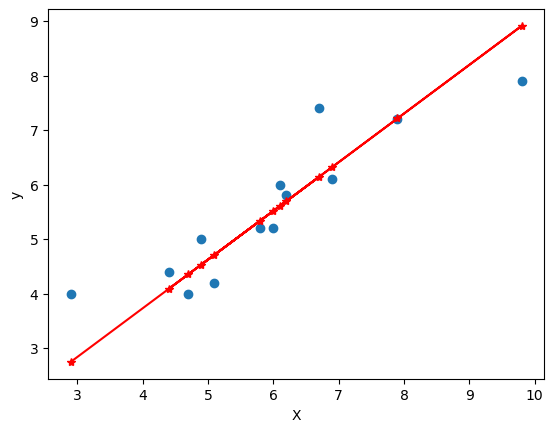

In [248]:
plt.scatter(X,y)
plt.plot(X, y_pred, color='red', marker='*')
plt.xlabel('X')
plt.ylabel('y')
plt.show()

### Use R Squared metrics to evaluate LR equation output [2 Marks]

In [249]:
y_mean = np.mean(y)
TSS = np.sum((y - y_mean)**2)
RSS = np.sum((y - y_pred)**2)
r2 = 1 - (RSS / TSS)
print("r squared =", r2)

r squared = 0.7483046604086072


### In order to obtain better score you can try to keep iterating to be closer to minimum: [2 Marks]
- Update the stop condition <b>grad_norm<0.001</b>.
- Increase the learning rate <b>(0.01)</b> to perform larger update step.
- Increase number of maximum iterations <b>(e.g. 10000)</b>.

In [250]:
theta_0 = 0
theta_1 = 0
eta = 0.01
max_iters = 10000
tol = 0.001

In [251]:
for i in range(max_iters):
    y_pred_new = theta_0 + theta_1 * X
    error = y_pred_new - y
    J = (1/(2*m)) * np.sum(error**2)
    gradient_0 = (1/m) * np.sum(error)
    gradient_1 = (1/m) * np.sum(error * X)
    grad_vector = np.array([[gradient_0], [gradient_1]])
    grad_norm = np.linalg.norm(grad_vector)
    if grad_norm < tol:
        print(f"Convergence reached at iteration {i}.")
        break
    theta_0 -= eta * gradient_0
    theta_1 -= eta * gradient_1
    print(f"****************** Iteration {i} ********************\n")
    print("h(x):", y_pred_new.flatten(), "\n")
    print("Error Vector:\n", error.flatten(), "\n")
    print("j =", J, "\n")
    print("Gradient Vector:\n", grad_vector, "\n")
    print("Gradient Vector Norm:\n", grad_norm, "\n")
    print("theta_0 :", theta_0)
    print("theta_1 :", theta_1)
    

****************** Iteration 0 ********************

h(x): [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] 

Error Vector:
 [-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981] 

j = 16.305384479692318 

Gradient Vector:
 [[ -5.56923074]
 [-35.04384604]] 

Gradient Vector Norm:
 35.483622652335995 

theta_0 : 0.05569230739769231
theta_1 : 0.35043846043215376
****************** Iteration 1 ********************

h(x): [1.07196388 2.40362993 1.7728408  2.82415618 3.48998929 2.47371772
 2.19336688 2.2284107  2.15832307 1.84292842 1.702753   1.59762157
 2.08823544] 

Error Vector:
 [-2.92803612 -4.99637017 -3.2271592  -4.37584363 -4.41001081 -3.62628219
 -3.80663312 -3.5715895  -3.04167674 -2.35707139 -2.297247   -2.80237853
 -3.11176436] 

j = 6.175608808043305 

Gradient Vector:
 [[ -3.42708175]
 [-21.33845263]] 

Gradient Vector Norm:
 21.611905283072655 

theta_0 : 0.08996312489803085
theta

### Use R Squared metrics to evaluate the new prediction. [2 Marks]

In [252]:
y_mean = np.mean(y)
TSS = np.sum((y - y_mean) ** 2)
RSS = np.sum((y - y_pred_new) ** 2)
r2_new = 1 - (RSS / TSS)

In [253]:
print("r squared: ", r2_new)

r squared:  0.8213066507162167


### You can try different values of max. iterations, learning rate, and grad_norm to achieve the best r2_score value in minimum number of iterations (Optional).

### Plot the new prediction and the original data [2 Marks]

In [254]:
plt.scatter(X,y)
plt.plot(X, y_pred_new, color='red', marker='*')
plt.xlabel('X')
plt.ylabel('y')

Text(0, 0.5, 'y')

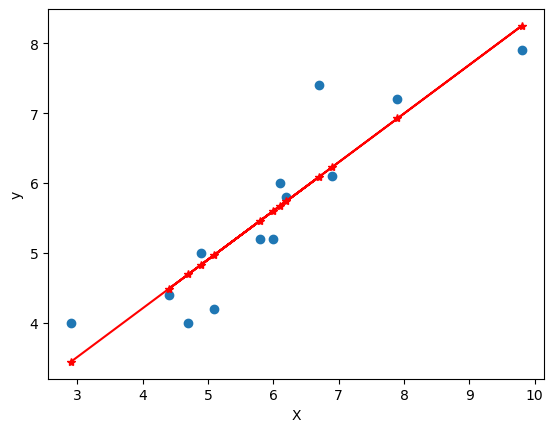

In [255]:
plt.show()

### Plot both predictions and the original data to see the difference in prediction. [2 Marks]

In [256]:
plt.scatter(X,y, label='original data')
plt.xlabel('X')
plt.ylabel('y')
plt.plot(X, y_pred, color='black', marker='*', label='1st Prediction')
plt.plot(X, y_pred_new, color='red', marker='^', label='2nd Prediction')
plt.legend()

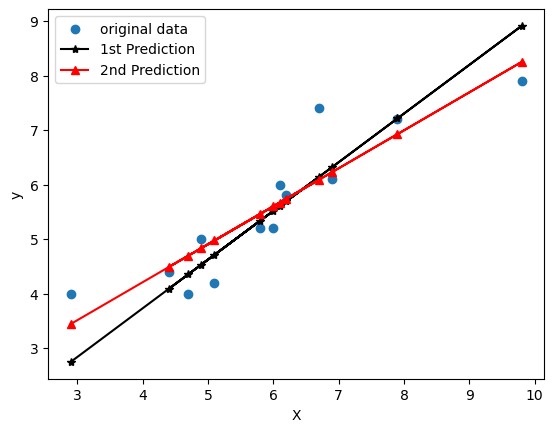

In [257]:
plt.show()

## Plot loss function

### Repeat your implementaion version and save loss for each iteration (epoch) [3 Marks]
### Use the following parameters:
- learning rate = 0.001.
- Maximum number of iterations = 1000.
- Stop condition grad_norm < 0.1.

In [258]:
theta_0 = 0
theta_1 = 0
eta = 0.001
max_iters = 1000
tol = 0.1

In [259]:
loss = []
theta_0_vals = []
theta_1_vals = []

In [260]:
for i in range(max_iters):
    h = theta_0 + theta_1 * X
    error = h - y
    J = (1 / (2 * m)) * np.sum(error ** 2)
    loss.append(J)
    
    theta_0_vals.append(theta_0)
    theta_1_vals.append(theta_1)
    
    grad_0 = (1 / m) * np.sum(error)
    grad_1 = (1 / m) * np.sum(error * X)
    grad_norm = np.sqrt(grad_0**2 + grad_1**2)
    
    if grad_norm < tol:
        print(f"Converged at iteration {i}")
        break
        
    theta_0 = theta_0 - eta * grad_0
    theta_1 = theta_1 - eta * grad_1
    print(f"****************** Iteration {i} ********************\n")
    print("h(x):", y_pred_new.flatten(), "\n")
    print("Error Vector:\n", error.flatten(), "\n")
    print("j =", J, "\n")
    print("Gradient Vector:\n", grad_vector, "\n")
    print("Gradient Vector Norm:\n", grad_norm, "\n")
    print("theta_0 :", theta_0)
    print("theta_1 :", theta_1)

****************** Iteration 0 ********************

h(x): [3.44046859 6.08812727 4.83397327 6.92423028 8.24805979 6.22747794
 5.67007594 5.73975111 5.60040077 4.9733236  4.6946226  4.4855971
 5.46105044] 

Error Vector:
 [-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981] 

j = 16.305384479692318 

Gradient Vector:
 [[-0.00098776]
 [ 0.00015438]] 

Gradient Vector Norm:
 35.483622652335995 

theta_0 : 0.005569230739769231
theta_1 : 0.03504384604321537
****************** Iteration 1 ********************

h(x): [3.44046859 6.08812727 4.83397327 6.92423028 8.24805979 6.22747794
 5.67007594 5.73975111 5.60040077 4.9733236  4.6946226  4.4855971
 5.46105044] 

Error Vector:
 [-3.89280361 -7.1596371  -4.82271592 -6.91758419 -7.55100117 -5.85262813
 -5.78066331 -5.57715912 -4.9841675  -4.01570697 -3.8297247  -4.24023794
 -4.99117626] 

j = 15.070907994095794 

Gradient Vector:
 [[-0.00098

In [261]:
y_mean = np.mean(y)
TSS = np.sum((y - y_mean) ** 2)
RSS = np.sum((y - h) ** 2)
r2_new = 1 - (RSS / TSS)

In [262]:
print('r squared: ', r2_new)

r squared:  0.7483046604086072


### Plot loss vs. iterations [2 Marks]

In [263]:
plt.plot(range(len(loss)), loss, marker='*')
plt.grid()

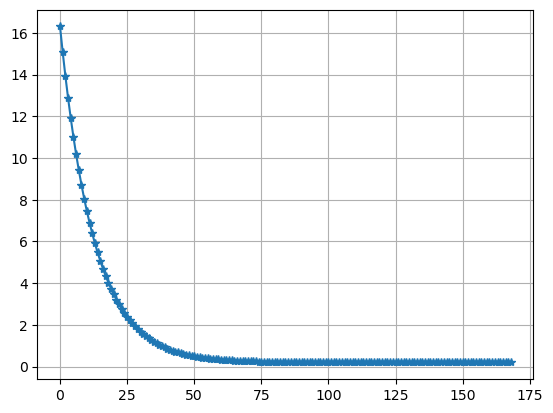

In [264]:
plt.show()

### Use the following parameters: [2 Marks]
- learning rate = 0.01.
- Maximum number of iterations = 10000.
- Stop condition grad_norm < 0.001.

In [265]:
theta_0 = 0
theta_1 = 0
eta = 0.01
max_iters = 10000
tol = 0.001

In [266]:
loss = []
theta_0_vals = []
theta_1_vals = []

In [267]:
for i in range(max_iters):
    h = theta_0 + theta_1 * X
    error = h - y
    J = (1 / (2 * m)) * np.sum(error ** 2)
    loss.append(J)
    
    theta_0_vals.append(theta_0)
    theta_1_vals.append(theta_1)
    
    grad_0 = (1 / m) * np.sum(error)
    grad_1 = (1 / m) * np.sum(error * X)
    grad_norm = np.sqrt(grad_0**2 + grad_1**2)
    
    if grad_norm < tol:
        print(f"Converged at iteration {i}")
        break
        
    theta_0 = theta_0 - eta * grad_0
    theta_1 = theta_1 - eta * grad_1
    print(f"****************** Iteration {i} ********************\n")
    print("h(x):", y_pred_new.flatten(), "\n")
    print("Error Vector:\n", error.flatten(), "\n")
    print("j =", J, "\n")
    print("Gradient Vector:\n", grad_vector, "\n")
    print("Gradient Vector Norm:\n", grad_norm, "\n")
    print("theta_0 :", theta_0)
    print("theta_1 :", theta_1)

****************** Iteration 0 ********************

h(x): [3.44046859 6.08812727 4.83397327 6.92423028 8.24805979 6.22747794
 5.67007594 5.73975111 5.60040077 4.9733236  4.6946226  4.4855971
 5.46105044] 

Error Vector:
 [-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981] 

j = 16.305384479692318 

Gradient Vector:
 [[-0.00098776]
 [ 0.00015438]] 

Gradient Vector Norm:
 35.483622652335995 

theta_0 : 0.05569230739769231
theta_1 : 0.35043846043215376
****************** Iteration 1 ********************

h(x): [3.44046859 6.08812727 4.83397327 6.92423028 8.24805979 6.22747794
 5.67007594 5.73975111 5.60040077 4.9733236  4.6946226  4.4855971
 5.46105044] 

Error Vector:
 [-2.92803612 -4.99637017 -3.2271592  -4.37584363 -4.41001081 -3.62628219
 -3.80663312 -3.5715895  -3.04167674 -2.35707139 -2.297247   -2.80237853
 -3.11176436] 

j = 6.175608808043305 

Gradient Vector:
 [[-0.0009877

In [268]:
y_mean = np.mean(y)
TSS = np.sum((y - y_mean) ** 2)
RSS = np.sum((y - h) ** 2)
r2_new = 1 - (RSS / TSS)

In [269]:
print("r squared:", r2_new)

r squared: 0.8213066507162167


In [270]:
plt.plot(range(len(loss)), loss, marker='*')
plt.grid()

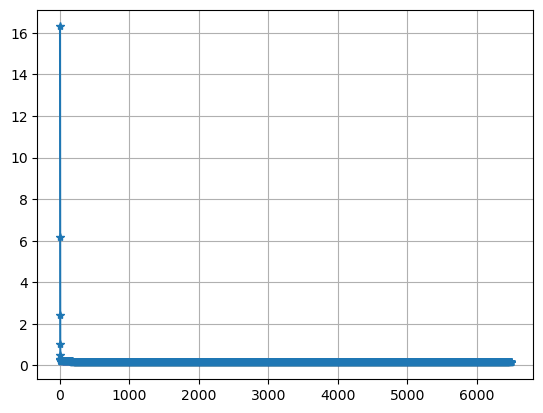

In [271]:
plt.show()

### Use the following parameters: [2 Marks]
- learning rate = 0.01.
- Maximum number of iterations = 1000.
- Stop condition grad_norm < 0.1.

In [272]:
theta_0 = 0
theta_1 = 0
eta = 0.01
max_iters = 1000
tol = 0.1

In [273]:
loss = []
theta_0_vals = []
theta_1_vals = []

In [274]:
for i in range(max_iters):
    h = theta_0 + theta_1 * X
    error = h - y
    J = (1 / (2 * m)) * np.sum(error ** 2)
    loss.append(J)
    
    theta_0_vals.append(theta_0)
    theta_1_vals.append(theta_1)
    
    grad_0 = (1 / m) * np.sum(error)
    grad_1 = (1 / m) * np.sum(error * X)
    grad_norm = np.sqrt(grad_0**2 + grad_1**2)
    
    if grad_norm < tol:
        print(f"Converged at iteration {i}")
        break
        
    theta_0 = theta_0 - eta * grad_0
    theta_1 = theta_1 - eta * grad_1
    print(f"****************** Iteration {i} ********************\n")
    print("h(x):", y_pred_new.flatten(), "\n")
    print("Error Vector:\n", error.flatten(), "\n")
    print("j =", J, "\n")
    print("Gradient Vector:\n", grad_vector, "\n")
    print("Gradient Vector Norm:\n", grad_norm, "\n")
    print("theta_0 :", theta_0)
    print("theta_1 :", theta_1)

****************** Iteration 0 ********************

h(x): [3.44046859 6.08812727 4.83397327 6.92423028 8.24805979 6.22747794
 5.67007594 5.73975111 5.60040077 4.9733236  4.6946226  4.4855971
 5.46105044] 

Error Vector:
 [-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981] 

j = 16.305384479692318 

Gradient Vector:
 [[-0.00098776]
 [ 0.00015438]] 

Gradient Vector Norm:
 35.483622652335995 

theta_0 : 0.05569230739769231
theta_1 : 0.35043846043215376
****************** Iteration 1 ********************

h(x): [3.44046859 6.08812727 4.83397327 6.92423028 8.24805979 6.22747794
 5.67007594 5.73975111 5.60040077 4.9733236  4.6946226  4.4855971
 5.46105044] 

Error Vector:
 [-2.92803612 -4.99637017 -3.2271592  -4.37584363 -4.41001081 -3.62628219
 -3.80663312 -3.5715895  -3.04167674 -2.35707139 -2.297247   -2.80237853
 -3.11176436] 

j = 6.175608808043305 

Gradient Vector:
 [[-0.0009877

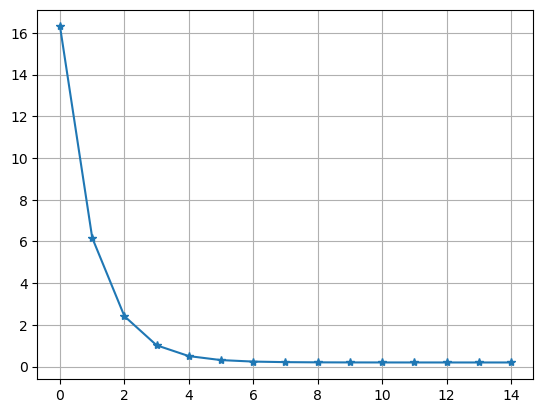

In [275]:
plt.plot(range(len(loss)), loss, marker='*')
plt.grid()
plt.show()

### Calculate r2_score

In [276]:
y_mean = np.mean(y)
TSS = np.sum((y - y_mean) ** 2)
RSS = np.sum((y - h) ** 2)
r2_new = 1 - (RSS / TSS)

In [277]:
print("r squared:", r2_new)

r squared: 0.7480324921408193


### You can play with these parameters to see how the training behavior changes (optional).

## Plot all learning curves:

### In order to see the other learning curves you need to save theta_0 and theta_1 values at each iteration then plot theta_0 vs. loss and theta_1 vs. loss.
### Use the following parameters: [3 Marks]
- learning rate = 0.01.
- Maximum number of iterations = 1000.
- Stop condition grad_norm < 0.1.

In [278]:
theta_0 = 0
theta_1 = 0
eta = 0.01
max_iters = 1000
tol = 0.1
theta_0_values = []
theta_1_values = []
loss_values = []

In [279]:
for i in range(max_iters):
    h = theta_0 + theta_1 * X
    error = h - y
    J = (1 / (2 * m)) * np.sum(error ** 2)
    loss_values.append(J)
    
    theta_0_values.append(theta_0)
    theta_1_values.append(theta_1)
    
    grad_0 = (1 / m) * np.sum(error)
    grad_1 = (1 / m) * np.sum(error * X)
    grad_norm = np.sqrt(grad_0**2 + grad_1**2)
    
    if grad_norm < tol:
        print(f"Converged at iteration {i}")
        break
        
    theta_0 = theta_0 - eta * grad_0
    theta_1 = theta_1 - eta * grad_1
    print(f"****************** Iteration {i} ********************\n")
    print("h(x):", y_pred_new.flatten(), "\n")
    print("Error Vector:\n", error.flatten(), "\n")
    print("j =", J, "\n")
    print("Gradient Vector:\n", grad_vector, "\n")
    print("Gradient Vector Norm:\n", grad_norm, "\n")
    print("theta_0 :", theta_0)
    print("theta_1 :", theta_1)

****************** Iteration 0 ********************

h(x): [3.44046859 6.08812727 4.83397327 6.92423028 8.24805979 6.22747794
 5.67007594 5.73975111 5.60040077 4.9733236  4.6946226  4.4855971
 5.46105044] 

Error Vector:
 [-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981] 

j = 16.305384479692318 

Gradient Vector:
 [[-0.00098776]
 [ 0.00015438]] 

Gradient Vector Norm:
 35.483622652335995 

theta_0 : 0.05569230739769231
theta_1 : 0.35043846043215376
****************** Iteration 1 ********************

h(x): [3.44046859 6.08812727 4.83397327 6.92423028 8.24805979 6.22747794
 5.67007594 5.73975111 5.60040077 4.9733236  4.6946226  4.4855971
 5.46105044] 

Error Vector:
 [-2.92803612 -4.99637017 -3.2271592  -4.37584363 -4.41001081 -3.62628219
 -3.80663312 -3.5715895  -3.04167674 -2.35707139 -2.297247   -2.80237853
 -3.11176436] 

j = 6.175608808043305 

Gradient Vector:
 [[-0.0009877

In [280]:
plt.plot(range(len(loss_values)), loss_values, marker='*')
plt.grid()
plt.xlabel("Epochs")
plt.ylabel("Loss")

Text(0, 0.5, 'Loss')

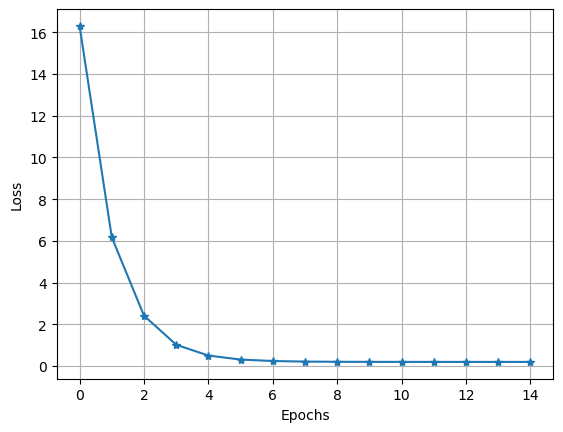

In [281]:
plt.show()

In [282]:
plt.plot(theta_0_values, loss_values, color='magenta', marker='o')
plt.xlabel("theta_0")
plt.ylabel("Loss")
plt.grid()

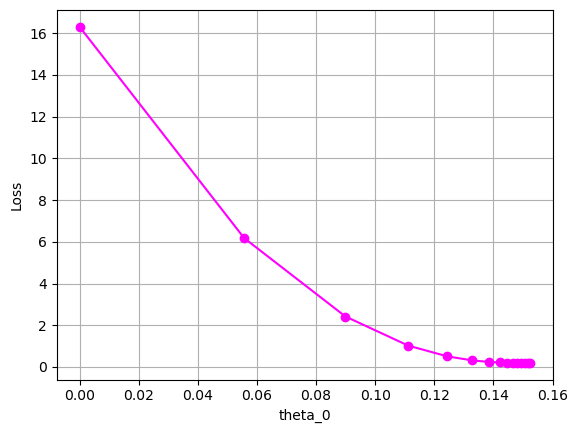

In [283]:
plt.show()

In [284]:
plt.plot(theta_1_values, loss_values, color='magenta', marker='o')
plt.xlabel("theta_1")
plt.ylabel("Loss")
plt.grid()

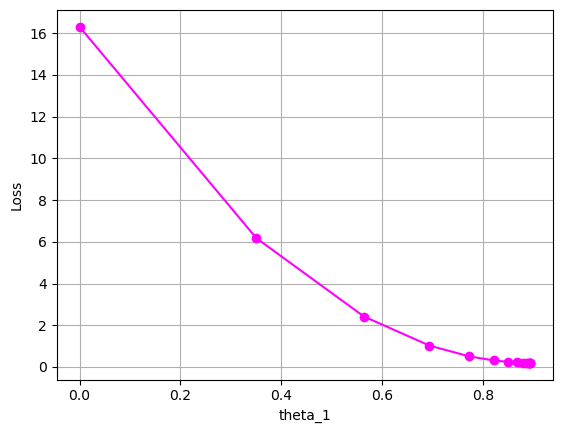

In [285]:
plt.show()